# DLPFC

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import umap

2023-06-17 14:24:53.076159: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-17 14:24:53.078030: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-17 14:24:53.115549: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-17 14:24:53.116714: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-17 14:24:53.740188: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [2]:
sample_name = '151672'
ds = 'DFPLC'
out_f = f'../datasets/{ds}/{sample_name}/'
adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')

make sure you have spatialPCA and slingshot installed first

In [ ]:
R_path = 'your R path'

In [ ]:

no_spatalk = False
if len(adata) > 10000:
    no_spatalk=True
idata = op.prep(adata, out_f, R_path, cluster_key=adata.uns['cluster_key'], is_human=adata.uns['is_human'], coord_type=adata.uns['coord_type'], no_spatalk=no_spatalk)
k = idata.uns['cell_meta'][adata.uns['cluster_key']].nunique()
i = 7
j = 50
interface_id = np.where(idata.obs_names == idata.obs[idata.obs['label']=='WM_WM'].index[0])[0]
count_f = f'{out_f}/idata_full_count.csv'
meta_f = f'{out_f}/idata_full_meta.csv'
idata.to_df().to_csv(count_f)
idata.obs[['row', 'col']].to_csv(meta_f)
from importlib import resources
with resources.path("spider.R_script", "run_spatialPCA.R") as pw_fn:
    os.system(str(f'/bin/bash -c "{R_path} -f /{pw_fn} {meta_f} {count_f} {k} {j} {out_f} {interface_id} {i}"'))
idata.write_h5ad(f'{out_f}/idata.h5ad')

if you have already run the scripts, you can read the results with

In [3]:
idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
features = pd.read_csv(f'{out_f}/interface_SpatialPCs.csv', index_col=0).T
idata.obsm['spatialPC'] = features.loc[idata.obs_names].to_numpy()
label_df = pd.read_csv(f'{out_f}/refined_interface_label.csv', index_col=0)
idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].to_numpy()


analysis

(-2.95, 72.95, -0.5500000000000007, 132.55)

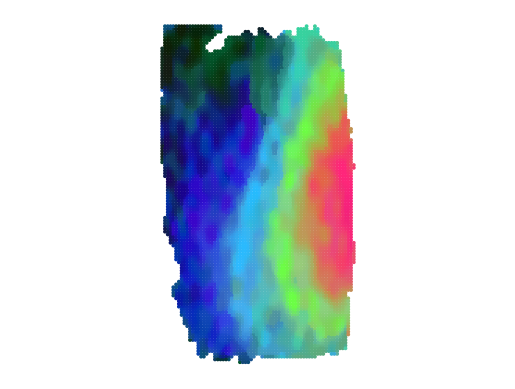

In [4]:
umap_3 = umap.UMAP(random_state=52, n_components=3).fit_transform(idata.obsm['spatialPC'])
normalized_df=pd.DataFrame(umap_3)
normalized_df = (normalized_df-normalized_df.min())/(normalized_df.max()-normalized_df.min())
normalized_df.columns=['r', 'g', 'b']
normalized_df[['x', 'y']] = idata.obsm['spatial']
plt.scatter(normalized_df.x, normalized_df.y, c = normalized_df[['r', 'g', 'b']].to_numpy(), s=3)
plt.axis('equal')
plt.axis('off')

(-2.95, 72.95, -0.5500000000000007, 132.55)

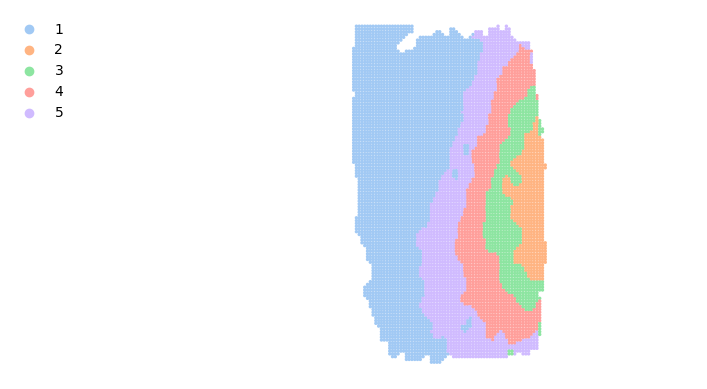

In [5]:
g=sns.scatterplot(data=label_df, x='row', y='col', hue = 'clusterlabel_refine', s=6, palette='pastel', linewidth=0)
g.legend(loc='upper left', bbox_to_anchor=(-0.4, 1), ncol=1,frameon =False)
plt.axis('equal')
plt.axis('off')

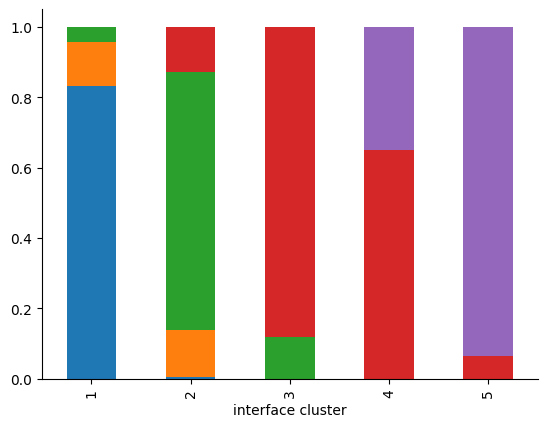

In [6]:
dfs = []
for i in idata.obs['label_spatialPCA'].unique():
    dfs.append(idata.uns['cell_meta'].loc[np.unique(idata.obs[idata.obs['label_spatialPCA']==i][['A', 'B']].to_numpy().flatten()), 'layer_guess'].value_counts())
dfs_merged = pd.concat(dfs, axis=1)
dfs_merged.columns=idata.obs['label_spatialPCA'].unique()
dfs_merged = (dfs_merged / dfs_merged.sum()).T
order = np.dot(dfs_merged, (range(1, len(dfs_merged.columns)+1))).argsort()
rename_dict = {}
for i in range(len(dfs_merged.index)):
    rename_dict[dfs_merged.index[order[i]]] = i+1
dfs_merged = dfs_merged.reset_index().rename(columns={'index':'interface cluster'})
dfs_merged['interface cluster'] = dfs_merged['interface cluster'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
label_df['clusterlabel_refine'] = label_df['clusterlabel_refine'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
g = dfs_merged.sort_values('interface cluster').plot.bar(x='interface cluster', stacked=True, legend=False)
g.spines[['right', 'top']].set_visible(False)

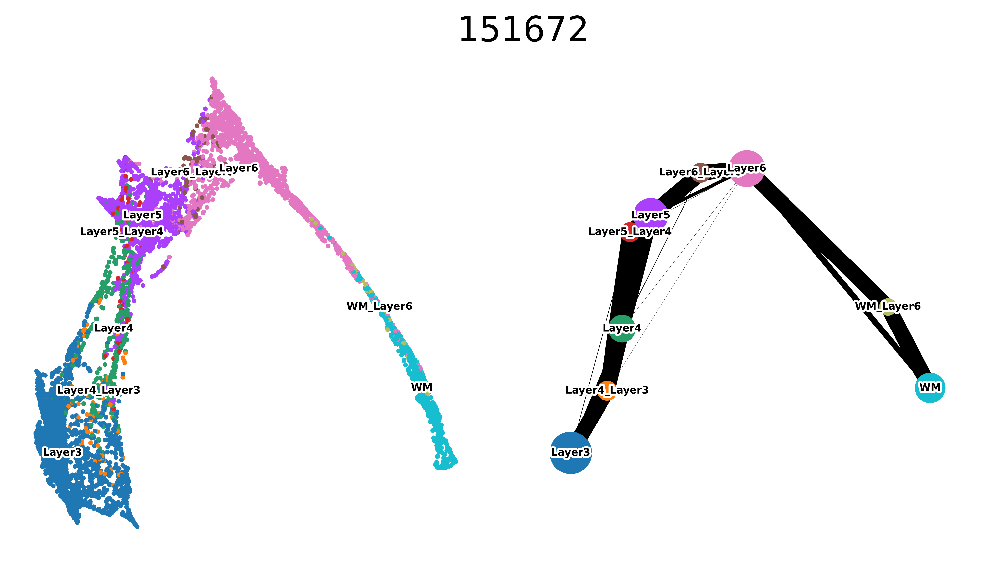

In [8]:
idata.obsm['smooth_pattern_score']  = idata.obsm['spatialPC']
op.traj.paga_default(idata, label='label')
sc.set_figure_params(dpi=300)
idata.obs['label'] = idata.obs['label'].astype('category').cat.rename_categories({
    'WM_WM': 'WM',    
    'Layer4_Layer4': 'Layer4',    
    'Layer1_Layer1': 'Layer1',    
    'Layer5_Layer5': 'Layer5',    
    'Layer6_Layer6': 'Layer6',    
    'Layer2_Layer2': 'Layer2',    
    'Layer3_Layer3': 'Layer3',    
})
with plt.rc_context():
    sc.pl.paga_compare(idata, legend_fontsize=5, frameon=False, size=20, fontweight='normal', legend_loc='on data',
                    title=sample_name, legend_fontoutline=2, show=False)
    plt.savefig(f'../figures/{ds}_{sample_name}_paga_compare.png', bbox_inches="tight")
    

In [9]:
idata.obs['label_spatialPCA'] = idata.obs['label_spatialPCA'].astype(str).astype('category')
sc.tl.rank_genes_groups(idata, groupby='label_spatialPCA', method='wilcoxon')
marker_df = op.util.get_marker_df(idata, logfoldchanges_threhold=5)

2    97
3    62
1    44
4    38
5    25
Name: cluster, dtype: int64


         Falling back to preprocessing with `sc.pp.pca` and default params.


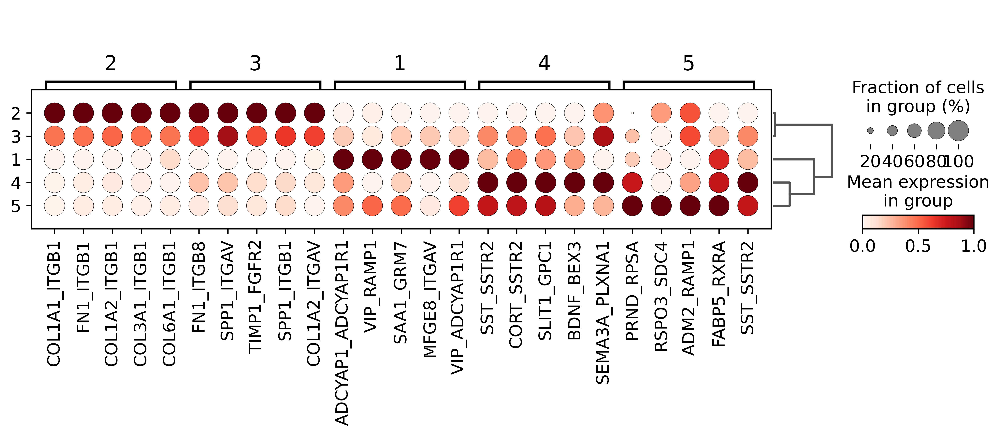

<Figure size 1200x1200 with 0 Axes>

In [10]:
with plt.rc_context():
    sc.pl.rank_genes_groups_dotplot(idata, n_genes=5, standard_scale='var',)
    # sc.pl.rank_genes_groups_dotplot(idata, n_genes=5,values_to_plot='logfoldchanges', min_logfoldchange=5, vmax=70, vmin=-70, cmap='bwr')
    plt.savefig(f'../figures/{ds}_{sample_name}_spatialpca_marker_dot.png', bbox_inches="tight")

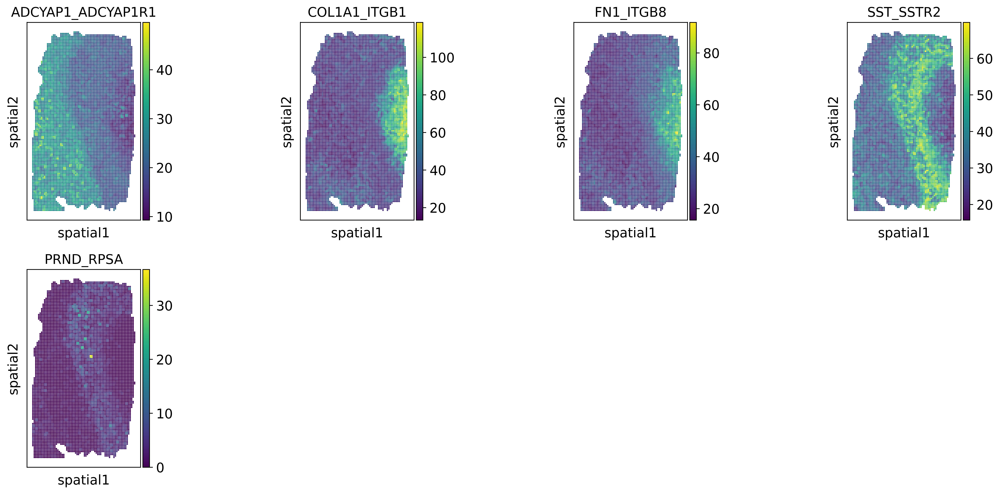

<Figure size 1200x1200 with 0 Axes>

In [11]:
with plt.rc_context():
    sc.pl.spatial(idata, color=list(idata.uns['rank_genes_groups']['names'][:1].flatten()[0]), spot_size=1)
    plt.savefig(f'../figures/{ds}_{sample_name}_spatialpca_marker_exp.png', bbox_inches="tight")

In [12]:
custom, background = op.er.pathway_prep(idata)
marker_df['g'] = marker_df['names']
marker_df['membership'] = 1
marker_df.to_csv(f'../tables/{ds}_{sample_name}_spatialpca_marker.csv')
merged_df_edge, arr = op.er.enrichment(custom, background, marker_df.set_index('names'), groupby='cluster')
merged_df_edge[merged_df_edge["Adjusted P-value"]<=0.05].to_csv(f'../tables/{ds}_{sample_name}_spatialpca_marker_edge_enrichment.csv')
merged_df_edge.to_csv(f'../tables/{ds}_{sample_name}_spatialpca_marker_edge_enrichment_full.csv')
merged_df, arr = op.er.enrichment_interacrtion_gene_df(marker_df.set_index('names'), groupby='cluster')
merged_df[merged_df["Adjusted P-value"]<=0.05].to_csv(f'../tables/{ds}_{sample_name}_spatialpca_marker_node_enrichment.csv')

Using human LR pair dataset.
